In [1]:
import warnings
warnings.simplefilter('ignore')

In [2]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'svg' 

In [3]:
from pylab import rcParams
rcParams['figure.figsize'] = 8, 5
import pandas as pd

In [4]:
df = pd.read_csv('mishkamyworld.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
Name               16717 non-null object
Platform           16719 non-null object
Year_of_Release    16450 non-null float64
Genre              16717 non-null object
Publisher          16665 non-null object
NA_Sales           16719 non-null float64
EU_Sales           16719 non-null float64
JP_Sales           16719 non-null float64
Other_Sales        16719 non-null float64
Global_Sales       16719 non-null float64
Critic_Score       8137 non-null float64
Critic_Count       8137 non-null float64
User_Score         10015 non-null object
User_Count         7590 non-null float64
Developer          10096 non-null object
Rating             9950 non-null object
dtypes: float64(9), object(7)
memory usage: 2.0+ MB


In [5]:
df['user_score'] = df.User_Score.astype('float64')
df['year_of_release'] = df.Year_of_Release.astype('int64')
df['user_count'] = df.User_Count.astype('int64')
df['critic_count'] = df.Critic_Count.astype('int64')

ValueError: could not convert string to float: 'tbd'

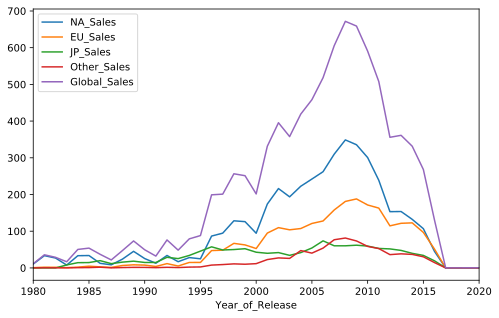

In [6]:
sales_df = df[[x for x in df.columns if 'Sales' in x] + ['Year_of_Release']]
sales_df.groupby('Year_of_Release').sum().plot()

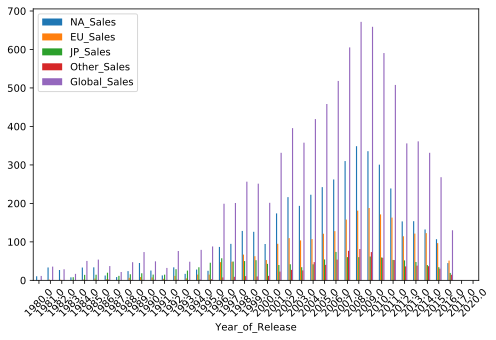

In [7]:
sales_df.groupby('Year_of_Release').sum().plot(kind='bar', rot=45)

In [8]:
cols = ['Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']
sns_plot = sns.pairplot(df[cols])
sns_plot.savefig('pairplot.png')

ValueError: cannot convert float NaN to integer

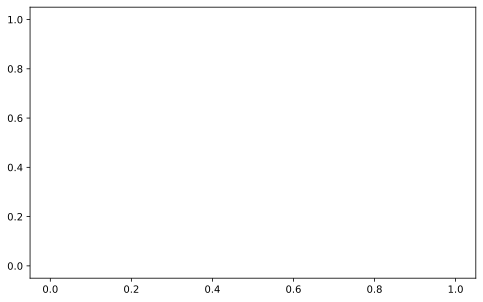

In [10]:
sns.distplot(df.Critic_Score)

ValueError: cannot convert float NaN to integer

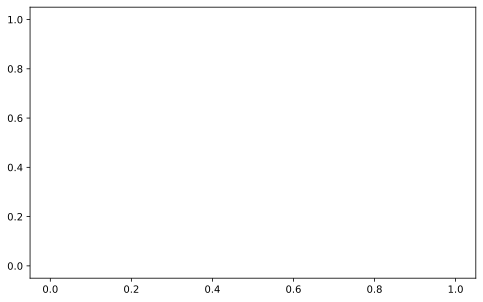

In [11]:
sns.distplot(df.Critic_Score)

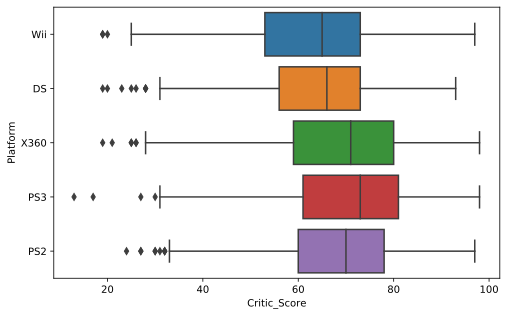

In [12]:
top_platforms = df.Platform.value_counts().sort_values(ascending = False).head(5).index.values
sns.boxplot(y="Platform", x="Critic_Score", data=df[df.Platform.isin(top_platforms)], orient="h")

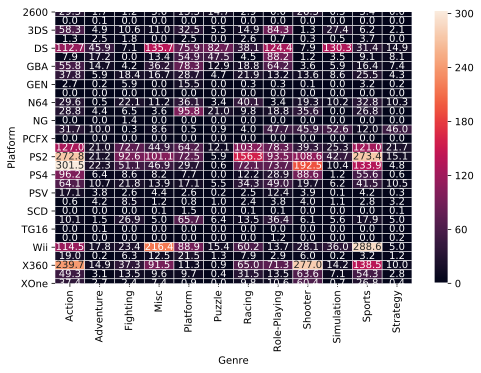

In [13]:
platform_genre_sales = df.pivot_table(
                        index='Platform', 
                        columns='Genre', 
                        values='Global_Sales', 
                        aggfunc=sum).fillna(0).applymap(float)
sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=.5)